# Toronto Dwellings Analysis

In this assignment, you will perform fundamental analysis for the Toronto dwellings market to allow potential real estate investors to choose rental investment properties.

In [1]:
# imports
import panel as pn
pn.extension('plotly')
import plotly.express as px
import hvplot.pandas
import pandas as pd
import matplotlib.pyplot as plt
import os
from pathlib import Path
from dotenv import load_dotenv


Bad key savefig.frameon in file C:\ProgramData\Anaconda3\envs\pyvizenv\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 421 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.4.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.level in file C:\ProgramData\Anaconda3\envs\pyvizenv\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 472 ('verbose.level  : silent      # one of silent, helpful, debug, debug-annoying')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.4.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.fileo in file C:\ProgramData\Anaconda3\envs\pyvizenv\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 473 ('verbose.fileo  : sys.stdout  # a log filename, sys.stdout or sys.stderr')
You probab

In [2]:
# Read the Mapbox API key
load_dotenv()
map_box_api = os.getenv("mapbox")

## Load Data

In [3]:
# Read the census data into a Pandas DataFrame
file_path = Path("Data/toronto_neighbourhoods_census_data.csv")
to_data = pd.read_csv(file_path, index_col="year")
to_data.head()

,neighbourhood,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house,average_house_value,shelter_costs_owned,shelter_costs_rented
year,,,,,,,,,,,,
2001,Agincourt North,3715,1480,0,1055,1295,195,185,5,200388,810,870
2001,Agincourt South-Malvern West,3250,1835,0,545,455,105,425,0,203047,806,892
2001,Alderwood,3175,315,0,470,50,185,370,0,259998,817,924
2001,Annex,1060,6090,5,1980,605,275,3710,165,453850,1027,1378
2001,Banbury-Don Mills,3615,4465,0,240,380,15,1360,0,371864,1007,1163


- - - 

## Dwelling Types Per Year

In this section, you will calculate the number of dwelling types per year. Visualize the results using bar charts and the Pandas plot function. 

**Hint:** Use the Pandas `groupby` function.

**Optional challenge:** Plot each bar chart in a different color.

In [4]:
# Calculate the sum number of dwelling types units per year (hint: use groupby)
sum_dwelling_type = to_data.groupby('year')[
    ['single_detached_house', 'apartment_five_storeys_plus', 'movable_dwelling', 'semi_detached_house', 'row_house', 'duplex', 'apartment_five_storeys_less', 'other_house' ]
    ].sum()
sum_dwelling_type

,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house
year,,,,,,,,
2001,300930,355015,75,90995,52355,23785,116900,3040
2006,266860,379400,165,69430,54690,44095,162850,1335
2011,274940,429220,100,72480,60355,44750,163895,2165
2016,269680,493270,95,71200,61565,48585,165575,2845


In [5]:
# Save the dataframe as a csv file
csv_file_path = Path("Data/sum_dwelling_type.csv")        #Set the out put file and path
sum_dwelling_type.to_csv(csv_file_path)                   #Save the df to csv

In [6]:
# Helper create_bar_chart function
def create_bar_chart(data, title, xlabel, ylabel, color):
    bar_chart = data.plot.bar(title=title, color=color)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    return bar_chart

<AxesSubplot:title={'center':'Dwelling Types in toronto in 2001'}, xlabel='2001', ylabel='Dwelling Types Units'>

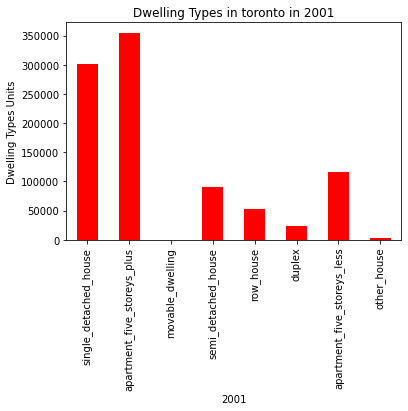

In [7]:
# Create a bar chart per year to show the number of dwelling types

# Bar chart for 2001
data_2001 = sum_dwelling_type.loc[2001]
create_bar_chart(data_2001, title='Dwelling Types in toronto in 2001', xlabel='2001', ylabel='Dwelling Types Units', color='Red')

<AxesSubplot:title={'center':'Dwelling Types in toronto in 2006'}, xlabel='2006', ylabel='Dwelling Types Units'>

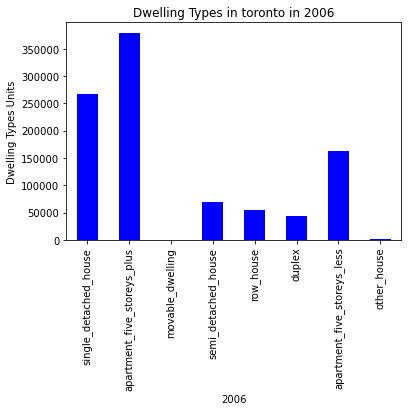

In [8]:
# Bar chart for 2006
data_2006 = sum_dwelling_type.loc[2006]
create_bar_chart(data_2006, title='Dwelling Types in toronto in 2006', xlabel='2006', ylabel='Dwelling Types Units', color='Blue')

<AxesSubplot:title={'center':'Dwelling Types in toronto in 2011'}, xlabel='2011', ylabel='Dwelling Types Units'>

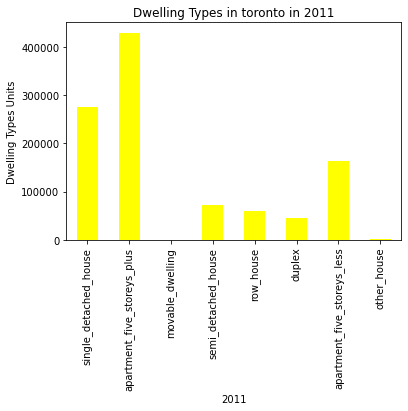

In [9]:
# Bar chart for 2011
data_2011 = sum_dwelling_type.loc[2011]
create_bar_chart(data_2011, title='Dwelling Types in toronto in 2011', xlabel='2011', ylabel='Dwelling Types Units', color='Yellow')

<AxesSubplot:title={'center':'Dwelling Types in toronto in 2016'}, xlabel='2016', ylabel='Dwelling Types Units'>

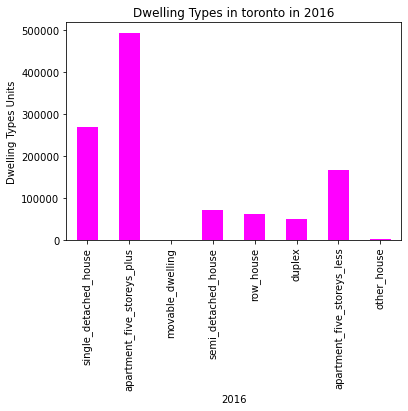

In [10]:
# Bar chart for 2016
data_2016 = sum_dwelling_type.loc[2016]
create_bar_chart(data_2016, title='Dwelling Types in toronto in 2016', xlabel='2016', ylabel='Dwelling Types Units', color='Magenta') 

- - - 

## Average Monthly Shelter Costs in Toronto Per Year

In this section, you will calculate the average monthly shelter costs for owned and rented dwellings and the average house value for each year. Plot the results as a line chart.

**Optional challenge:** Plot each line chart in a different color.

In [11]:
# Calculate the average monthly shelter costs for owned and rented dwellings
avg_monthly_shelter = to_data.groupby('year')[
    ['shelter_costs_owned', 'shelter_costs_rented']
    ].mean()
avg_monthly_shelter

,shelter_costs_owned,shelter_costs_rented
year,,
2001,846.878571,1085.935714
2006,1316.800000,925.414286
2011,1448.214286,1019.792857
2016,1761.314286,1256.321429


In [12]:
# Helper create_line_chart function
def create_line_chart(data, title, xlabel, ylabel, color):
    line_chart = data.plot.line( title=title, color=color)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    return line_chart

<AxesSubplot:title={'center':'Average Monthly Shelter Cost for Owned Dwellings in Toronto'}, xlabel='Year', ylabel='Average Monthly Shelter Cost'>

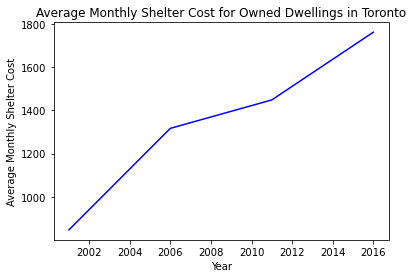

In [13]:
# Create two line charts, one to plot the monthly shelter costs for owned dwelleing and other for rented dwellings per year
# Line chart for owned dwellings
avg_shelter_costs_owned = avg_monthly_shelter['shelter_costs_owned']
create_line_chart(avg_shelter_costs_owned, title='Average Monthly Shelter Cost for Owned Dwellings in Toronto', 
                  xlabel='Year', 
                  ylabel='Average Monthly Shelter Cost', color='Blue') 

<AxesSubplot:title={'center':'Average Monthly Shelter Cost for Rented Dwellings in Toronto'}, xlabel='Year', ylabel='Average Monthly Shelter Cost'>

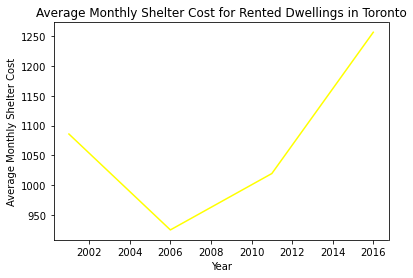

In [14]:
# Line chart for rented dwellings
avg_shelter_costs_rented = avg_monthly_shelter['shelter_costs_rented']
create_line_chart(avg_shelter_costs_rented, title='Average Monthly Shelter Cost for Rented Dwellings in Toronto', 
                  xlabel='Year', 
                  ylabel='Average Monthly Shelter Cost', color='Yellow')

## Average House Value per Year

In this section, you want to determine the average house value per year. An investor may want to understand better the sales price of the rental property over time. For example, a customer will want to know if they should expect an increase or decrease in the property value over time so they can determine how long to hold the rental property. You will visualize the `average_house_value` per year as a bar chart.

In [15]:
# Calculate the average house value per year
avg_house_value = to_data.groupby('year')['average_house_value'].mean()
avg_house_value

year
2001    289882.885714
2006    424059.664286
2011    530424.721429
2016    664068.328571
Name: average_house_value, dtype: float64

<AxesSubplot:title={'center':'Average House Value in Toronto'}, xlabel='Year', ylabel='Avg House Value'>

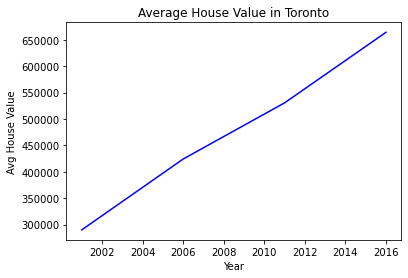

In [16]:
# Plot the average house value per year as a line chart
create_line_chart(avg_house_value, title='Average House Value in Toronto', 
                  xlabel='Year', ylabel='Avg House Value', color='Blue')

- - - 

## Average House Value by Neighbourhood

In this section, you will use `hvplot` to create an interactive visualization of the average house value with a dropdown selector for the neighbourhood.

**Hint:** It will be easier to create a new DataFrame from grouping the data and calculating the mean house values for each year and neighbourhood.

In [17]:
# Create a new DataFrame with the mean house values by neighbourhood per year
house_value_by_neighbourhood=pd.DataFrame(to_data[["neighbourhood","average_house_value"]])
house_value_by_neighbourhood.reset_index(inplace=True)
house_value_by_neighbourhood

,year,neighbourhood,average_house_value
0,2001,Agincourt North,200388
1,2001,Agincourt South-Malvern West,203047
2,2001,Alderwood,259998
3,2001,Annex,453850
4,2001,Banbury-Don Mills,371864
...,...,...,...
555,2016,Wychwood,787760
556,2016,Yonge-Eglinton,1127052
557,2016,Yonge-St.Clair,1131888
558,2016,York University Heights,425769


In [18]:
# Use hvplot to create an interactive line chart of the average house value per neighbourhood
# The plot should have a dropdown selector for the neighbourhood
house_value_by_neighbourhood.hvplot("year", "average_house_value", groupby="neighbourhood", kind="line", xlabel="Year", ylabel="Average House Value" )

:DynamicMap   [neighbourhood]
   :Curve   [year]   (average_house_value)

## Number of Dwelling Types per Year

In this section, you will use `hvplot` to create an interactive visualization of the average number of dwelling types per year with a dropdown selector for the neighbourhood.

In [19]:
# Fetch the data of all dwelling types per year
all_dwelling_type = pd.DataFrame(to_data)
all_dwelling_type.head(5)

,neighbourhood,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house,average_house_value,shelter_costs_owned,shelter_costs_rented
year,,,,,,,,,,,,
2001,Agincourt North,3715,1480,0,1055,1295,195,185,5,200388,810,870
2001,Agincourt South-Malvern West,3250,1835,0,545,455,105,425,0,203047,806,892
2001,Alderwood,3175,315,0,470,50,185,370,0,259998,817,924
2001,Annex,1060,6090,5,1980,605,275,3710,165,453850,1027,1378
2001,Banbury-Don Mills,3615,4465,0,240,380,15,1360,0,371864,1007,1163


In [20]:
# Use hvplot to create an interactive bar chart of the number of dwelling types per neighbourhood
# The plot should have a dropdown selector for the neighbourhood
all_dwelling_type.hvplot(x="year",
                         y=['single_detached_house', 'apartment_five_storeys_plus', 'movable_dwelling', 
                            'semi_detached_house', 'row_house', 'duplex', 'apartment_five_storeys_less', 'other_house'],
                         groupby="neighbourhood", kind="bar", xlabel="Year", ylabel="Dwelling types", rot=90, height=500, width=900) 

:DynamicMap   [neighbourhood]
   :Bars   [year,Variable]   (value)

- - - 

## The Top 10 Most Expensive Neighbourhoods

In this section, you will need to calculate the house value for each neighbourhood and then sort the values to obtain the top 10 most expensive neighbourhoods on average. Plot the results as a bar chart.

In [21]:
# Getting the data from the top 10 expensive neighbourhoods
neighbourhood = pd.DataFrame(to_data[["neighbourhood","average_house_value"]])
neighbourhood = neighbourhood.groupby("neighbourhood").mean()
expensive_neighbourhood_10 = neighbourhood.sort_values(by='average_house_value', ascending=False).head(10)
expensive_neighbourhood_10

,average_house_value
neighbourhood,
Bridle Path-Sunnybrook-York Mills,1526485.75
Forest Hill South,1195992.50
Lawrence Park South,1094027.75
Rosedale-Moore Park,1093640.00
St.Andrew-Windfields,999107.00
Casa Loma,981064.25
Bedford Park-Nortown,930415.25
Forest Hill North,851680.50
Kingsway South,843234.25


In [22]:
# Plotting the data from the top 10 expensive neighbourhoods
expensive_neighbourhood_10.hvplot(
    x="neighbourhood",
    y="average_house_value", 
    kind="bar", 
    xlabel="Year", 
    ylabel="Avg. House Value", 
    rot=90, height=500, width=800)

:Bars   [neighbourhood]   (average_house_value)

- - - 

## Neighbourhood Map

In this section, you will read in neighbourhoods location data and build an interactive map with the average house value per neighbourhood. Use a `scatter_mapbox` from Plotly express to create the visualization. Remember, you will need your Mapbox API key for this.

### Load Location Data

In [23]:
# Load neighbourhoods coordinates data
file_path = Path("Data/toronto_neighbourhoods_coordinates.csv")
df_neighbourhood_locations = pd.read_csv(file_path)
df_neighbourhood_locations.head()

,neighbourhood,lat,lon
0,Agincourt North,43.805441,-79.266712
1,Agincourt South-Malvern West,43.788658,-79.265612
2,Alderwood,43.604937,-79.541611
3,Annex,43.671585,-79.404001
4,Banbury-Don Mills,43.737657,-79.349718


### Data Preparation

You will need to join the location data with the mean values per neighbourhood.

1. Calculate the mean values for each neighbourhood.

2. Join the average values with the neighbourhood locations.

In [24]:
# Calculate the mean values for each neighborhood
house = pd.DataFrame(to_data[["neighbourhood","average_house_value"]])
mean_house = house.groupby("neighbourhood").mean()
mean_house = mean_house.reset_index()
mean_house

,neighbourhood,average_house_value
0,Agincourt North,329811.50
1,Agincourt South-Malvern West,334189.00
2,Alderwood,427922.50
3,Annex,746977.00
4,Banbury-Don Mills,612039.00
...,...,...
135,Wychwood,565976.50
136,Yonge-Eglinton,809745.75
137,Yonge-St.Clair,813220.25
138,York University Heights,305899.50


In [25]:
# Join the average values with the neighbourhood locations
all_data = pd.concat([df_neighbourhood_locations, mean_house['average_house_value']
                      ],axis="columns").dropna()  
all_data.head()


,neighbourhood,lat,lon,average_house_value
0,Agincourt North,43.805441,-79.266712,329811.5
1,Agincourt South-Malvern West,43.788658,-79.265612,334189.0
2,Alderwood,43.604937,-79.541611,427922.5
3,Annex,43.671585,-79.404001,746977.0
4,Banbury-Don Mills,43.737657,-79.349718,612039.0


### Mapbox Visualization

Plot the average values per neighbourhood using a Plotly express `scatter_mapbox` visualization.

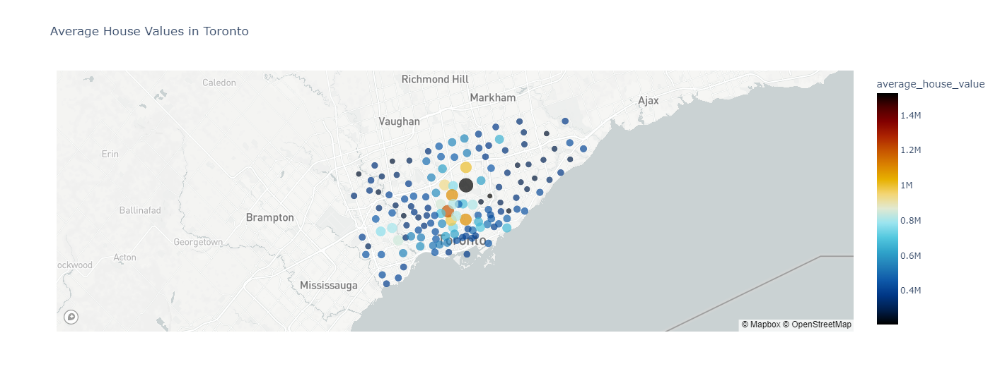

In [26]:
# Create a scatter mapbox to analyze neighbourhood info
px.set_mapbox_access_token(map_box_api)
plot = px.scatter_mapbox(
    all_data, lat="lat", lon="lon", 
    color="average_house_value", 
    size="average_house_value",                    
    color_continuous_scale=px.colors.cyclical.IceFire,
    size_max=15,
    zoom=9,
    hover_name="neighbourhood",
    title="Average House Values in Toronto",
    width=1200,
    height=550)
plot


- - -

## Cost Analysis - Optional Challenge

In this section, you will use Plotly express to a couple of plots that investors can interactively filter and explore various factors related to the house value of the Toronto's neighbourhoods. 

### Create a bar chart row facet to plot the average house values for all Toronto's neighbourhoods per year

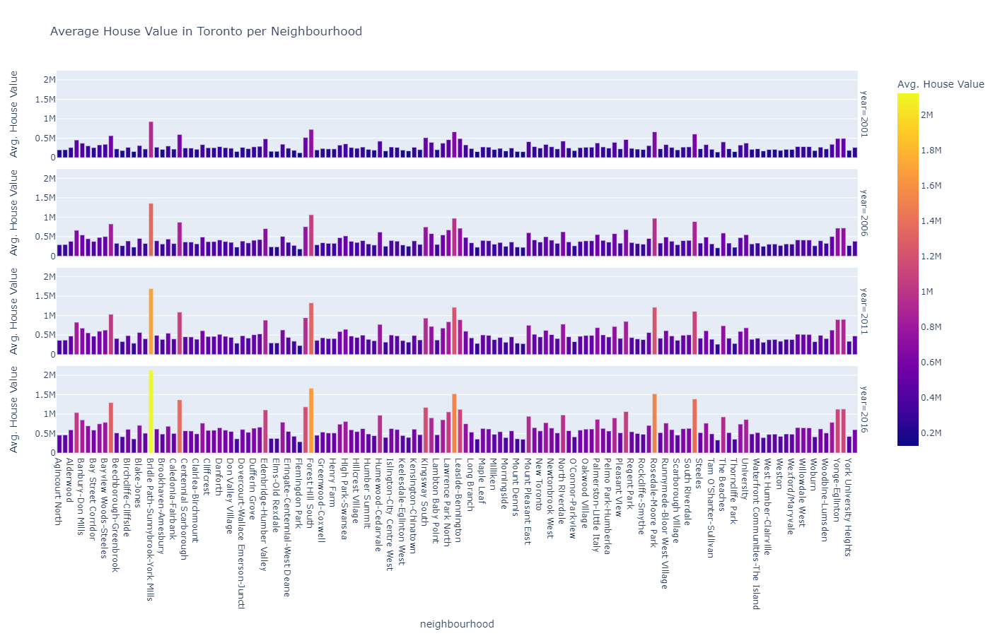

In [39]:
avg_house_value = pd.DataFrame(to_data[[ "neighbourhood","average_house_value"]])
avg_house_value.rename(columns={'average_house_value' : 'Avg. House Value'}, inplace=True)

bar_chart_row_facet = px.bar(avg_house_value, x="neighbourhood", y="Avg. House Value", color="Avg. House Value", 
                             width=1500, height=900, facet_row=avg_house_value.index, title='Average House Value in Toronto per Neighbourhood', labels ="sdf")

bar_chart_row_facet.show()


### Create a sunburst chart to conduct a costs analysis of most expensive neighbourhoods in Toronto per year

In [28]:
# Fetch the data from all expensive neighbourhoods per year.
expensive_neighbourhoods = to_data.reset_index()
expensive_neighbourhoods = pd.DataFrame(expensive_neighbourhoods[["year", "neighbourhood","average_house_value"]])
expensive_neighbourhoods = expensive_neighbourhoods.sort_values(by='average_house_value', ascending=False)
expensive_neighbourhoods

,year,neighbourhood,average_house_value
436,2016,Bridle Path-Sunnybrook-York Mills,2124653
296,2011,Bridle Path-Sunnybrook-York Mills,1697067
464,2016,Forest Hill South,1664653
489,2016,Lawrence Park South,1522732
524,2016,Rosedale-Moore Park,1522193
...,...,...,...
73,2001,Malvern,156076
118,2001,Thorncliffe Park,155094
81,2001,Mount Olive-Silverstone-Jamestown,153829
115,2001,Taylor-Massey,145464


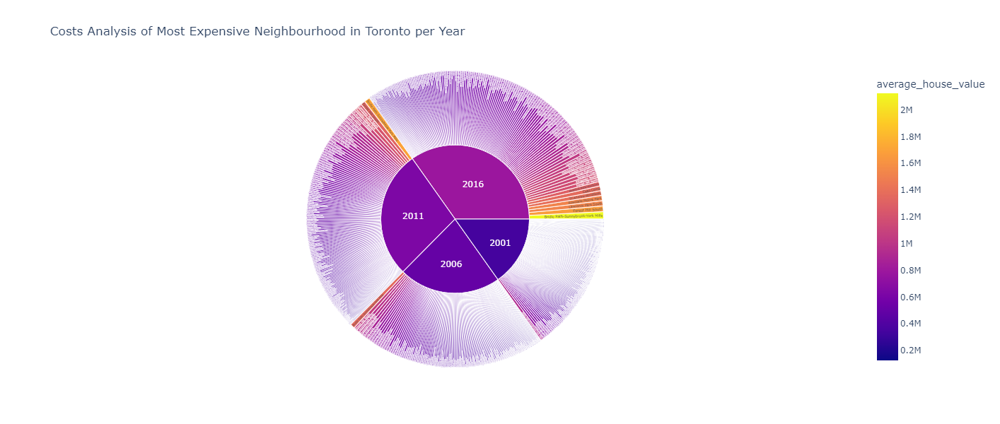

In [29]:
# Create the sunburst chart
fig = px.sunburst(expensive_neighbourhoods, path=['year', 'neighbourhood'], values='average_house_value',
                 width=600, height=600,
                 color='average_house_value', 
                 title="Costs Analysis of Most Expensive Neighbourhood in Toronto per Year")

fig.show()